In [1]:
pip install imgaug

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 948.0/948.0 kB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 59.1 MB/s eta 0:00:00


In [3]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow import keras
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense, Conv2D
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

In [4]:
#downloading data
!git clone https://github.com/rslim087a/track

Cloning into 'track'...
remote: Enumerating objects: 12163, done.
remote: Total 12163 (delta 0), reused 0 (delta 0), pack-reused 12163 (from 1)
Receiving objects: 100% (12163/12163), 156.98 MiB | 60.80 MiB/s, done.
Updating files: 100% (12160/12160), done.


In [5]:
directory_path = 'track'
column_headers = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
driving_data = pd.read_csv(os.path.join(directory_path, 'driving_log.csv'), names=column_headers)
pd.set_option('display.max_colwidth', None)
driving_data.head()


,center,left,right,steering,throttle,reverse,speed
0,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


In [6]:
def extract_filename(filepath):
    head, tail = ntpath.split(filepath)
    return tail

driving_data['center'] = driving_data['center'].apply(extract_filename)
driving_data['left'] = driving_data['left'].apply(extract_filename)
driving_data['right'] = driving_data['right'].apply(extract_filename)
driving_data.head()


,center,left,right,steering,throttle,reverse,speed
0,center_2018_07_16_17_11_43_382.jpg,left_2018_07_16_17_11_43_382.jpg,right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,center_2018_07_16_17_11_43_670.jpg,left_2018_07_16_17_11_43_670.jpg,right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,center_2018_07_16_17_11_43_724.jpg,left_2018_07_16_17_11_43_724.jpg,right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,center_2018_07_16_17_11_43_792.jpg,left_2018_07_16_17_11_43_792.jpg,right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,center_2018_07_16_17_11_43_860.jpg,left_2018_07_16_17_11_43_860.jpg,right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


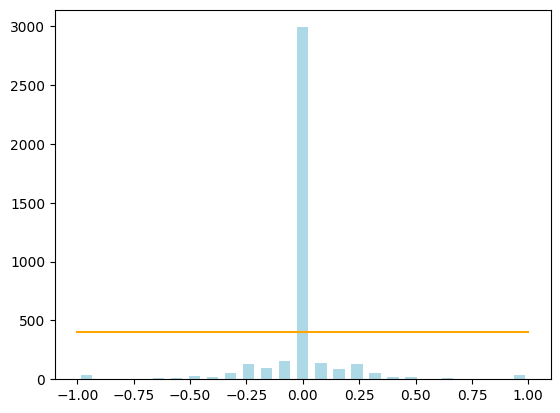

In [7]:
num_of_bins = 25
max_samples_per_bin = 400
steering_hist, steering_bins = np.histogram(driving_data['steering'], num_of_bins)
bin_centers = (steering_bins[:-1] + steering_bins[1:]) * 0.5

plt.bar(bin_centers, steering_hist, width=0.05, color='lightblue')

plt.plot((np.min(driving_data['steering']), np.max(driving_data['steering'])),
         (max_samples_per_bin, max_samples_per_bin), color='orange')
plt.show()


In [8]:
print('Total records in dataset:', len(driving_data))
print('Dataset dimensions:', driving_data.shape)


Total records in dataset: 4053
Dataset dimensions: (4053, 7)


In [9]:
indices_to_remove = []

for bin_idx in range(num_of_bins):
    indices_in_bin = []
    for idx in range(len(driving_data['steering'])):
        if driving_data['steering'][idx] >= steering_bins[bin_idx] and driving_data['steering'][idx] <= steering_bins[bin_idx + 1]:
            indices_in_bin.append(idx)
    indices_in_bin = shuffle(indices_in_bin)
    indices_to_remove_from_bin = indices_in_bin[max_samples_per_bin:]
    indices_to_remove.extend(indices_to_remove_from_bin)

print('Total records removed:', len(indices_to_remove))
driving_data.drop(driving_data.index[indices_to_remove], inplace=True)
print('Remaining records:', len(driving_data))


Total records removed: 2590
Remaining records: 1463


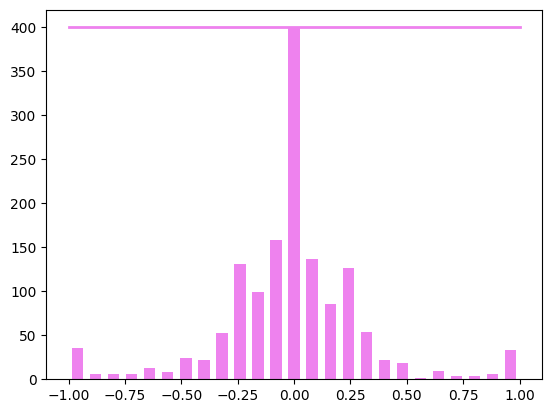

In [11]:
plt.bar(bin_centers, steering_hist, width=0.05, color='violet')
plt.plot((np.min(driving_data['steering']), np.max(driving_data['steering'])),
         (max_samples_per_bin, max_samples_per_bin), color='violet', linewidth=2)

plt.show()


In [12]:
def load_images_and_steering(data_directory, dataframe):
    image_paths = []
    steering_angles = []

    for index in range(len(dataframe)):
        row_data = dataframe.iloc[index]
        center_image, left_image, right_image = row_data[0], row_data[1], row_data[2]

        image_paths.append(os.path.join(data_directory, center_image.strip()))
        steering_angles.append(float(row_data[3]))

        image_paths.append(os.path.join(data_directory, left_image.strip()))
        steering_angles.append(float(row_data[3]) + 0.15)

        image_paths.append(os.path.join(data_directory, right_image.strip()))
        steering_angles.append(float(row_data[3]) - 0.15)

    image_paths_array = np.asarray(image_paths)
    steering_angles_array = np.asarray(steering_angles)

    return image_paths_array, steering_angles_array


In [15]:
data_directory = 'track'

image_paths, steering_angles = load_images_and_steering(data_directory + '/IMG', driving_data)

X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steering_angles, test_size=0.2, random_state=6)

print('Training Samples: {}\nValidation Samples: {}'.format(len(X_train), len(X_valid)))


Training Samples: 3511
Validation Samples: 878


<ipython-input-12-d066ca63764c>:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center_image, left_image, right_image = row_data[0], row_data[1], row_data[2]
<ipython-input-12-d066ca63764c>:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering_angles.append(float(row_data[3]))
<ipython-input-12-d066ca63764c>:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering_angles.append(float(row_data[3]) + 0.15)
<ipython-input-12-d0

In [16]:
print(image_paths[0])


track/IMG/center_2018_07_16_17_11_44_274.jpg


In [17]:
print(steering_angles[0])


0.0


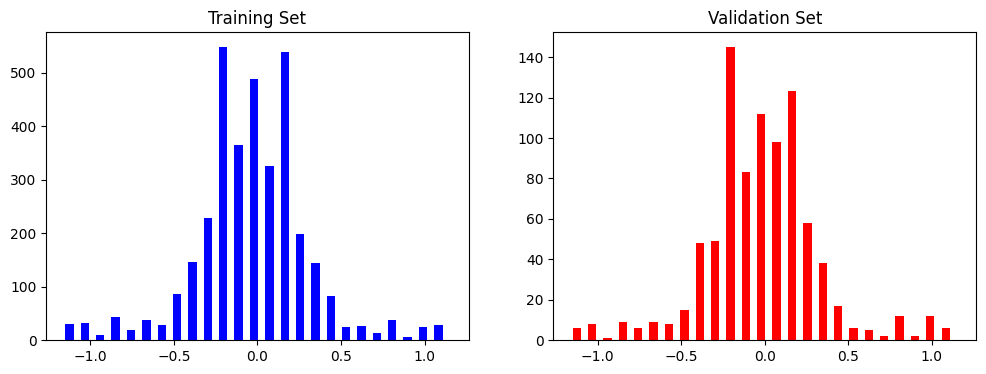

In [18]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].hist(y_train, bins=num_of_bins, width=0.05, color='blue')
axes[0].set_title('Training Set')

axes[1].hist(y_valid, bins=num_of_bins, width=0.05, color='red')
axes[1].set_title('Validation Set')

plt.show()


Text(0.5, 1.0, 'Zoomed Image')

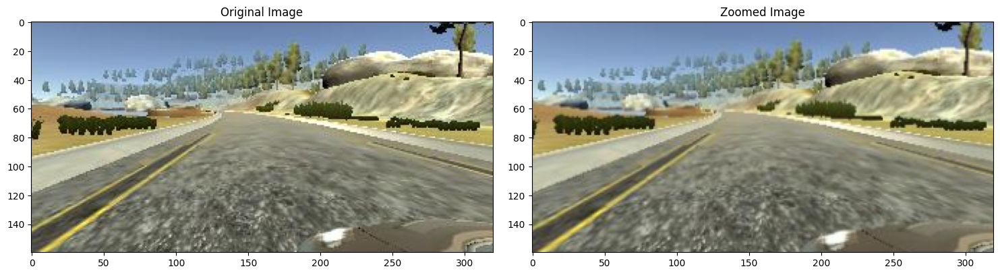

In [19]:
def apply_zoom(image):
    zoom_augmenter = iaa.Affine(scale=(1, 1.3))
    zoomed_image = zoom_augmenter.augment_image(image)
    return zoomed_image

random_image_path = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(random_image_path)

zoomed_image = apply_zoom(original_image)

fig, axes = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axes[0].imshow(original_image)
axes[0].set_title('Original Image')

axes[1].imshow(zoomed_image)
axes[1].set_title('Zoomed Image')


Text(0.5, 1.0, 'Panned Image')

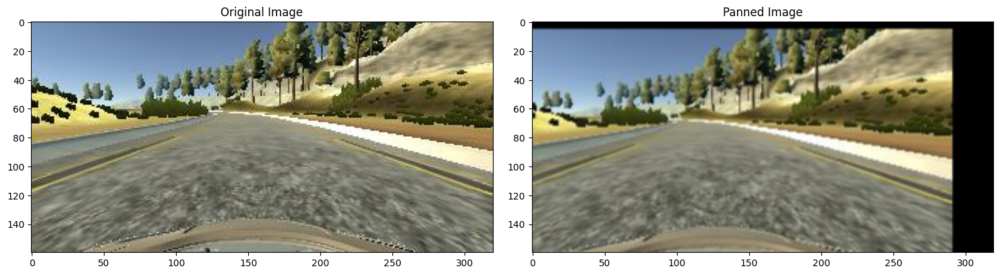

In [20]:
def apply_pan(image):
    pan_augmenter = iaa.Affine(translate_percent={"x": (-0.1, 0.1), "y": (-0.1, 0.1)})
    panned_image = pan_augmenter.augment_image(image)
    return panned_image

random_image_path = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(random_image_path)

panned_image = apply_pan(original_image)

fig, axes = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axes[0].imshow(original_image)
axes[0].set_title('Original Image')

axes[1].imshow(panned_image)
axes[1].set_title('Panned Image')


Text(0.5, 1.0, 'Brightness Adjusted Image')

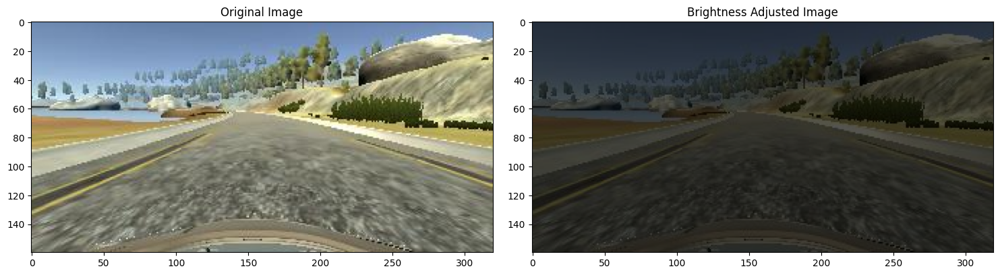

In [21]:
def apply_random_brightness(image):
    brightness_augmenter = iaa.Multiply((0.2, 1.2))
    adjusted_image = brightness_augmenter.augment_image(image)
    return adjusted_image

random_image_path = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(random_image_path)

brightness_adjusted_image = apply_random_brightness(original_image)

fig, axes = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axes[0].imshow(original_image)
axes[0].set_title('Original Image')

axes[1].imshow(brightness_adjusted_image)
axes[1].set_title('Brightness Adjusted Image')


Text(0.5, 1.0, 'Flipped Image - Steering Angle: 0.25')

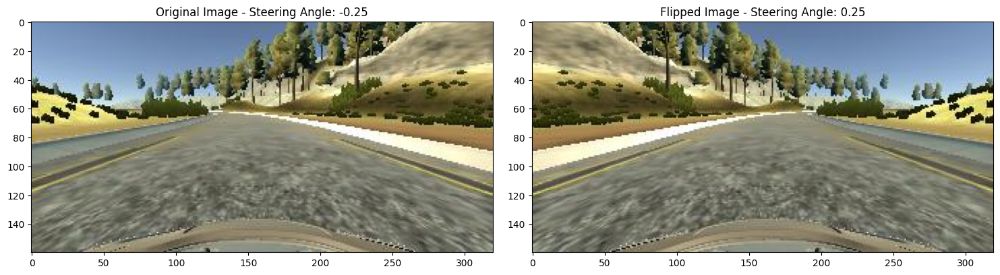

In [22]:
def apply_random_flip(image, steering_angle):
    flipped_image = cv2.flip(image, 1)
    flipped_steering_angle = -steering_angle
    return flipped_image, flipped_steering_angle

random_index = random.randint(0, 1000)
random_image_path = image_paths[random_index]
random_steering_angle = steering_angles[random_index]

original_image = mpimg.imread(random_image_path)

flipped_image, flipped_steering_angle = apply_random_flip(original_image, random_steering_angle)

fig, axes = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axes[0].imshow(original_image)
axes[0].set_title(f'Original Image - Steering Angle: {random_steering_angle}')

axes[1].imshow(flipped_image)
axes[1].set_title(f'Flipped Image - Steering Angle: {flipped_steering_angle}')


In [23]:
def apply_random_augmentations(image_path, steering_angle):
    image = mpimg.imread(image_path)

    if np.random.rand() < 0.5:
        image = apply_pan(image)

    if np.random.rand() < 0.5:
        image = apply_zoom(image)

    if np.random.rand() < 0.5:
        image = apply_random_brightness(image)

    if np.random.rand() < 0.5:
        image, steering_angle = apply_random_flip(image, steering_angle)

    return image, steering_angle


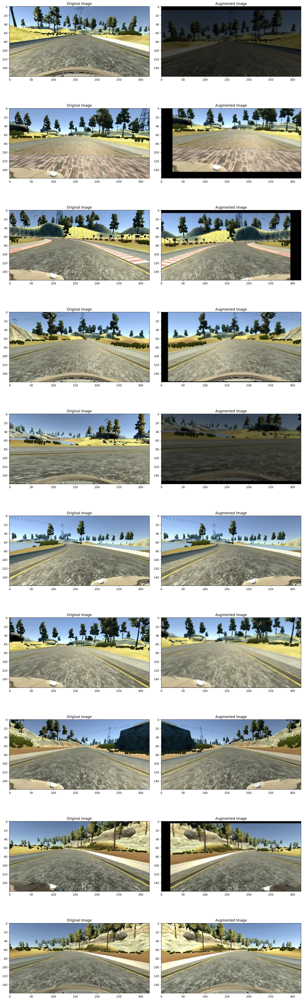

In [24]:
num_cols = 2
num_rows = 10

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 50))
fig.tight_layout()

for row in range(num_rows):
    random_index = random.randint(0, len(image_paths) - 1)
    random_image_path = image_paths[random_index]
    random_steering_angle = steering_angles[random_index]

    original_image = mpimg.imread(random_image_path)
    augmented_image, augmented_steering_angle = apply_random_augmentations(random_image_path, random_steering_angle)

    axes[row][0].imshow(original_image)
    axes[row][0].set_title("Original Image")

    axes[row][1].imshow(augmented_image)
    axes[row][1].set_title("Augmented Image")


In [25]:
def preprocess_image(image):
    image = image[60:135, :, :]

    image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)

    image = cv2.GaussianBlur(image, (3, 3), 0)

    image = cv2.resize(image, (200, 66))

    image = image / 255.0

    return image


Text(0.5, 1.0, 'Preprocessed Image')

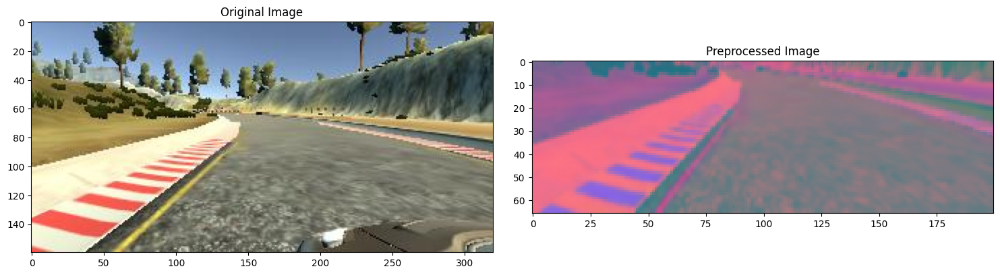

In [26]:
selected_image_path = image_paths[100]
original_image = mpimg.imread(selected_image_path)

preprocessed_image = preprocess_image(original_image)

fig, axes = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axes[0].imshow(original_image)
axes[0].set_title('Original Image')

axes[1].imshow(preprocessed_image)
axes[1].set_title('Preprocessed Image')


In [27]:
def generate_batches(image_paths, steering_angles, batch_size, is_training):
    while True:
        batch_images = []
        batch_steerings = []

        for _ in range(batch_size):
            random_index = random.randint(0, len(image_paths) - 1)

            if is_training:
                image, steering = apply_random_augmentations(
                    image_paths[random_index], steering_angles[random_index]
                )
            else:
                image = mpimg.imread(image_paths[random_index])
                steering = steering_angles[random_index]

            image = preprocess_image(image)
            batch_images.append(image)
            batch_steerings.append(steering)

        yield np.asarray(batch_images), np.asarray(batch_steerings)

x_train_gen, y_train_gen = next(generate_batches(X_train, y_train, 1, is_training=True))
x_valid_gen, y_valid_gen = next(generate_batches(X_valid, y_valid, 1, is_training=False))


Text(0.5, 1.0, 'Validation Image')

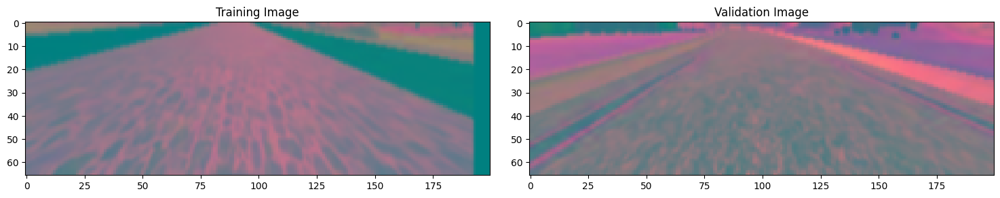

In [28]:
fig, axes = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axes[0].imshow(x_train_gen[0])
axes[0].set_title('Training Image')

axes[1].imshow(x_valid_gen[0])
axes[1].set_title('Validation Image')


In [29]:
def build_nvidia_model():
    model = Sequential()

    model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
    model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(64, (5, 5), activation='elu'))


    model.add(Flatten())

    model.add(Dense(100, activation='elu'))

    model.add(Dense(50, activation='elu'))

    model.add(Dense(10, activation='elu'))

    model.add(Dense(1))

    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
    model.compile(loss='mse', optimizer=optimizer)

    return model

model = build_nvidia_model()
print(model.summary())


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 1, 18, 64)         76864     
                                                                 
 flatten (Flatten)           (None, 1152)              0         
                                                                 
 dense (Dense)               (None, 100)               115300    
                                                                 
 dense_1 (Dense)             (None, 50)                5

In [30]:
history = model.fit(
    generate_batches(X_train, y_train, batch_size=100, is_training=True),
    steps_per_epoch=300,
    epochs=12,
    validation_data=generate_batches(X_valid, y_valid, batch_size=100, is_training=False),
    validation_steps=200,
    verbose=1,
    shuffle=True
)


Epoch 1/12
300/300 [==============================] - 221s 733ms/step - loss: 0.1674 - val_loss: 0.0903
Epoch 2/12
300/300 [==============================] - 215s 716ms/step - loss: 0.0813 - val_loss: 0.0567
Epoch 3/12
300/300 [==============================] - 217s 723ms/step - loss: 0.0692 - val_loss: 0.0501
Epoch 4/12
300/300 [==============================] - 213s 711ms/step - loss: 0.0633 - val_loss: 0.0455
Epoch 5/12
300/300 [==============================] - 216s 720ms/step - loss: 0.0561 - val_loss: 0.0460
Epoch 6/12
300/300 [==============================] - 217s 723ms/step - loss: 0.0512 - val_loss: 0.0380
Epoch 7/12
300/300 [==============================] - 217s 723ms/step - loss: 0.0479 - val_loss: 0.0397
Epoch 8/12
300/300 [==============================] - 205s 685ms/step - loss: 0.0464 - val_loss: 0.0359
Epoch 9/12
300/300 [==============================] - 205s 684ms/step - loss: 0.0444 - val_loss: 0.0311
Epoch 10/12
300/300 [==============================] - 205s 683m

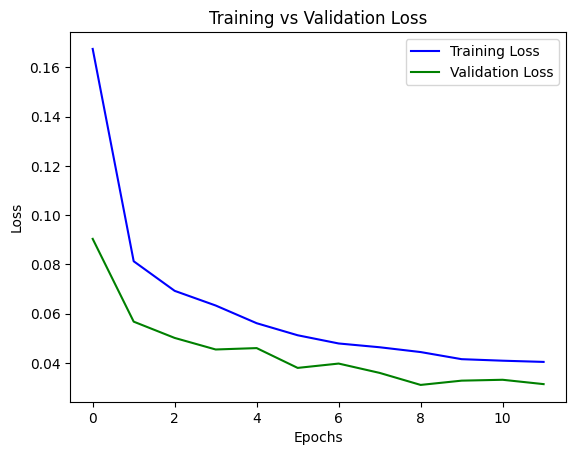

In [31]:
# Plot the training loss
plt.plot(history.history['loss'], color='blue', label='Training Loss')  # Change 'blue' to preferred color

# Plot the validation loss
plt.plot(history.history['val_loss'], color='green', label='Validation Loss')  # Change 'green' to preferred color

# Add legend, title, and axis labels
plt.legend()
plt.title('Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')

# Show the plot
plt.show()


In [ ]:
model.save('model.h5')
from google.colab import files
files.download('model.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [32]:
# Calculate MSE for training and validation data
train_mse = np.mean(history.history['loss'])
val_mse = np.mean(history.history['val_loss'])

# Print the results
print(f"Mean Squared Error (MSE) - Training: {train_mse:.4f}")
print(f"Mean Squared Error (MSE) - Validation: {val_mse:.4f}")


Mean Squared Error (MSE) - Training: 0.0625
Mean Squared Error (MSE) - Validation: 0.0442
